## Analyzing Donald Trump's tweets from his personal id @realDonaldTrump

### Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#cleaning">Data Cleaning</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#tweets">Analyzing Tweets</a></li>
<li><a href="#RTs">Analyzing Retweets (basic)</a></li>
<li><a href="#sources">Sources</a></li>
</ul>

#####  

<a id='intro'></a>
### Introduction

#### Our analysis is divided in two basic categories:
#### 1) His twitter metrics - retweets, favorites, time of tweets, number of tweets, device/platform used to tweet, and
#### 2) The actual content of the tweet
#####  

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import sys
import nltk
from random import choices
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly import tools

In [2]:
# reading the updated tweets file. Updated until 31 March 2020

trump = pd.read_csv('Trump.csv')

In [3]:
trump.head()

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
0,Twitter for iPhone,LIGHT AT THE END OF THE TUNNEL!,04-06-2020 11:55:14,4604.0,19232,false,1.247131e+18
1,Twitter for iPhone,USA STRONG!,04-06-2020 11:54:33,2795.0,11766,false,1.247131e+18
2,Twitter for iPhone,Thank you Gayle. I only wish the public could ...,04-06-2020 11:53:00,1610.0,5307,false,1.247130e+18
3,Twitter for iPhone,For humanitarian reasons the passengers from t...,04-06-2020 11:49:57,2067.0,8947,false,1.247129e+18
4,Twitter for iPhone,.@gayletrotter “To this day the establishment...,04-06-2020 11:40:45,3137.0,12857,false,1.247127e+18


In [4]:
trump.info() # finding total number of entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44250 entries, 0 to 44249
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   source          44250 non-null  object 
 1   text            44249 non-null  object 
 2   created_at      44246 non-null  object 
 3   retweet_count   44246 non-null  float64
 4   favorite_count  44246 non-null  object 
 5   is_retweet      44188 non-null  object 
 6   id_str          44243 non-null  float64
dtypes: float64(2), object(5)
memory usage: 2.4+ MB


In [5]:
trump.isnull().sum() # finding number of null values

source             0
text               1
created_at         4
retweet_count      4
favorite_count     4
is_retweet        62
id_str             7
dtype: int64

<a id='cleaning'></a>
### Cleaning the Data

In [6]:
# because there's such a huge amount of data, and the number of null values are low, those rows were dropped entirely

trump.loc[trump['text'].isnull()]
trump = trump.dropna(subset=['text'])
trump.loc[trump['created_at'].isnull()]
trump = trump.dropna(subset=['created_at'])
trump.loc[trump['id_str'].isnull()]
trump = trump.dropna(subset=['id_str'])

In [7]:
# Rows with null values in is_retweet was not deleted; it will be checked manually

trump.isnull().sum()

source             0
text               0
created_at         0
retweet_count      0
favorite_count     0
is_retweet        58
id_str             0
dtype: int64

In [8]:
# checking rows where is_retweet is null shows that these are not retweets

trump.loc[trump.is_retweet.isnull()]

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
14219,Twitter for iPhone,Thanks to all of the Republican and Democratic...,01-09-2018 22:51:50,11718.0,58068,NaN,9.508627e+17
14220,Twitter for iPhone,It was my great honor to sign H.R. 267 the “Ma...,01-09-2018 20:17:17,17249.0,73554,NaN,9.508238e+17
14221,Twitter for iPhone,On behalf of the American people THANK YOU to ...,01-09-2018 17:11:23,26793.0,112613,NaN,9.507770e+17
14222,Twitter for iPhone,We are fighting for our farmers for our countr...,01-08-2018 23:19:47,22044.0,104968,NaN,9.505074e+17
14223,Twitter for iPhone,In every decision we make we are honoring Amer...,01-08-2018 22:59:37,17769.0,81027,NaN,9.505023e+17
14224,Twitter for iPhone,We have been working every day to DELIVER for ...,01-08-2018 22:58:13,11561.0,57809,NaN,9.505019e+17
14225,Twitter for iPhone,Can’t wait to be back in the amazing state of ...,01-08-2018 19:06:40,10242.0,54355,NaN,9.504437e+17
14226,Twitter for iPhone,African American unemployment is the lowest ev...,01-08-2018 14:20:25,34648.0,132122,NaN,9.503716e+17
14227,Twitter for iPhone,...Clinton in the WH doubling down on Barack O...,01-08-2018 03:24:23,18904.0,83265,NaN,9.502065e+17
14228,Twitter for iPhone,“His is turning out to be an enormously conseq...,01-08-2018 03:23:39,16880.0,82631,NaN,9.502063e+17


In [9]:
# since they were not retweets, the value was added manually

trump.loc[trump.is_retweet.isnull()].is_retweet = 'false'

C:\Users\samue\Anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [10]:
# there were a few rows in which the actual tweet was missing but it did show up as null; this was removed here

trump = trump[trump.text != ""]
trump[trump.text == ""]

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str


In [11]:
# converting retweet count and favorite count to numerical values

trump.retweet_count = pd.to_numeric(trump.retweet_count, errors='coerce')
trump.favorite_count = pd.to_numeric(trump.favorite_count, errors='coerce')

In [12]:
# converting source and tweet to string

trump.source = trump.source.astype(str)
trump.text = trump.text.astype(str)

In [13]:
# converting tweet time to datetime

trump['created_at'] = pd.to_datetime(trump['created_at'], format='%m-%d-%Y %H:%M:%S')

In [14]:
# using only tweets from Trump, ignoring retweets

tweets = trump[trump.is_retweet == 'false']

In [15]:
# a function removing links that he's added to his tweets (starts with http or https), to be used for text analysis

def remove_links(tweets):
    text = tweets.split()
    text = [word for word in text if not (word.startswith('http:') or word.startswith('https:'))]
    return ' '.join(text)

In [16]:
# a function to remove numbers and punctuation by excluding anything not an alphabet, to be used for text analysis

def filter_alpha(tweets):
    text = tweets.split()
    text = [word for word in text if word.isalpha()]
    return ' '.join(text)

In [17]:
# applying the above functions to the second dataframe with only his tweets (ignoring RTs)

tweets.text = tweets.text.apply(remove_links)
tweets.text = tweets.text.apply(filter_alpha)
tweets.text = tweets.text.str.lower()
tweets = tweets[tweets.text != ""]

C:\Users\samue\Anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [18]:
tweets[tweets.text == ""] # checking if there are any empty tweets (even though it was cleaned from original dataframe)

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str


In [19]:
tweets.text.head() # a dataframe with only text (alphabets) from his tweets

0                              light at the end of the
1                                                  usa
2    thank you i only wish the public could fully u...
3    for humanitarian reasons the passengers from t...
4    this day the establishment media have not admi...
Name: text, dtype: object

In [20]:
# Creating a time series for possible future use, using only his tweets (ignoring RTs)

trump_ts = tweets.set_index('created_at')
trump_ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39340 entries, 2020-04-06 11:55:14 to 2009-05-04 18:54:25
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   source          39340 non-null  object 
 1   text            39340 non-null  object 
 2   retweet_count   39340 non-null  float64
 3   favorite_count  39340 non-null  int64  
 4   is_retweet      39340 non-null  object 
 5   id_str          39340 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 2.1+ MB


In [21]:
trump_ts[trump_ts.text == ""] # checking for empty tweets (though it was cleaned from original dataframe)

,source,text,retweet_count,favorite_count,is_retweet,id_str
created_at,,,,,,


In [22]:
trump_ts.head()

,source,text,retweet_count,favorite_count,is_retweet,id_str
created_at,,,,,,
2020-04-06 11:55:14,Twitter for iPhone,light at the end of the,4604.0,19232,false,1.247131e+18
2020-04-06 11:54:33,Twitter for iPhone,usa,2795.0,11766,false,1.247131e+18
2020-04-06 11:53:00,Twitter for iPhone,thank you i only wish the public could fully u...,1610.0,5307,false,1.247130e+18
2020-04-06 11:49:57,Twitter for iPhone,for humanitarian reasons the passengers from t...,2067.0,8947,false,1.247129e+18
2020-04-06 11:40:45,Twitter for iPhone,this day the establishment media have not admi...,3137.0,12857,false,1.247127e+18


<a id='eda'></a>
### Exploratory Data Analysis

In [23]:
trump['source'].unique() # taking a look at the various devices, platforms he uses to tweet from

array(['Twitter for iPhone', 'Twitter Media Studio', 'Twitter Web App',
       'Twitter Web Client', 'Twitter for iPad', 'Media Studio',
       'Twitter Ads', 'Twitter for Android', 'Periscope', 'TweetDeck',
       'Instagram', 'Mobile Web (M5)', 'Twitter Mirror for iPad',
       'Twitter QandA', 'Facebook', 'Twitter for BlackBerry',
       'Neatly For BlackBerry 10', 'Twitter for Websites', 'Twitlonger',
       'Vine - Make a Scene', 'TwitLonger Beta'], dtype=object)

In [24]:
trump['source'].value_counts().head() # finding out which platform he uses the most; ans: his iPhone

Twitter for iPhone     18350
Twitter for Android    12898
Twitter Web Client     11297
TweetDeck                473
TwitLonger Beta          334
Name: source, dtype: int64

In [25]:
# most retweeted one

tweets.loc[tweets.retweet_count == tweets.retweet_count.max()]

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
17115,Twitter for Android,today we make america great,2016-11-08 11:43:14,344806.0,573283,false,7.959548e+17


In [26]:
# most liked one

tweets.loc[tweets.favorite_count == tweets.favorite_count.max()]

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
7435,Twitter for iPhone,rocky released from prison and on his way home...,2019-08-02 17:41:30,251530.0,879647,false,1.157346e+18


#### Making a simple word cloud

In [27]:
import wordcloud as wc

In [28]:
# making a list with the words from Trump's tweets
# 'will' should have been taken out by wc.stopwords; doing it manually

trump_words = ' '.join(tweets.text.tolist()).replace('will','')

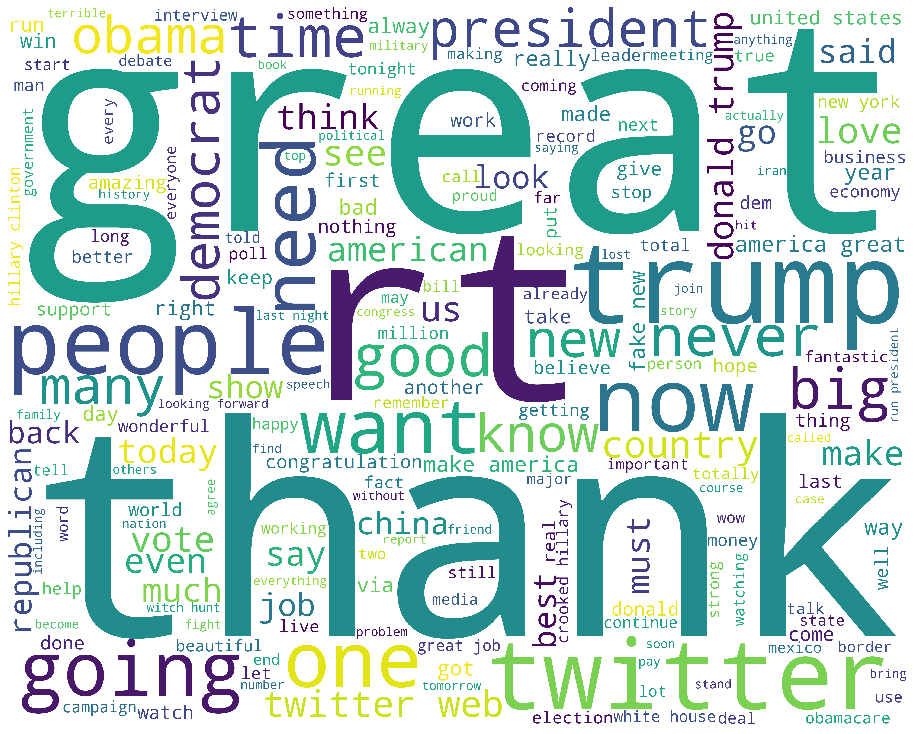

In [29]:
# it's not a mistake, Trump talks about twitter a lot on twitter

trump_wordcloud = wc.WordCloud(width = 5120, height = 4096, background_color='white',
                               stopwords=wc.STOPWORDS).generate(trump_words)

plt.figure(figsize=(20,10), facecolor = 'white', edgecolor='blue')
plt.imshow(trump_wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show();

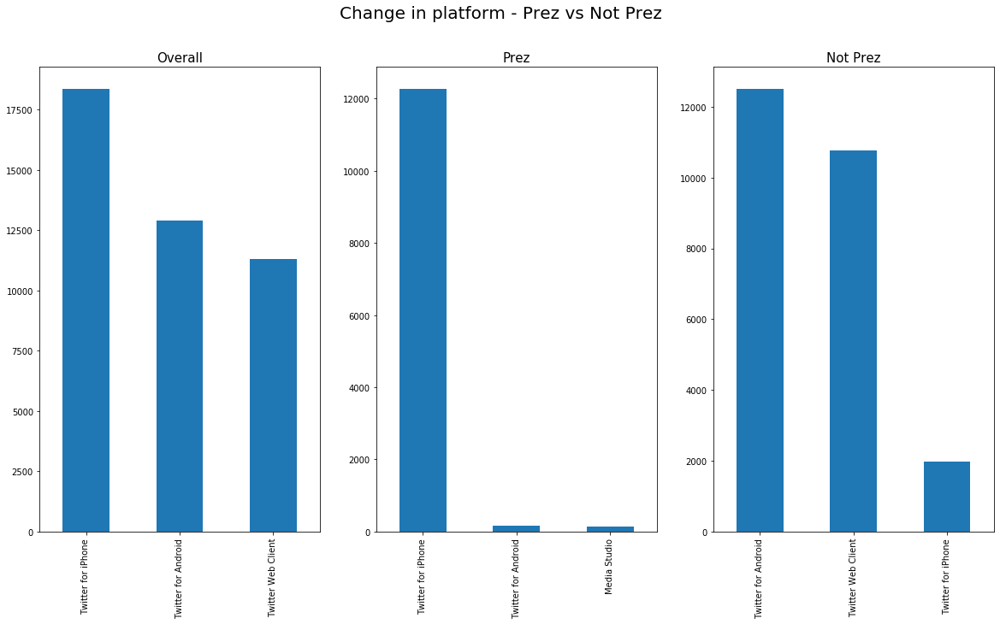

In [30]:
# using the time series to divide data before and after he became the US president
# this graph looks at change in device before and after; he moved from Android to iOS (iPhone)

fig, ax = plt.subplots(1,3,figsize=(20,10))
fig.suptitle('Change in platform - Prez vs Not Prez',size=20)

overall = trump['source'].value_counts().head(3).plot(kind='bar',ax=ax[0])
overall.set_title('Overall',size=15)
prez_graph = trump_ts['2020-04-06':'2017-01-20']['source'].value_counts().head(3).plot(kind='bar', ax=ax[1])
prez_graph.set_title('Prez',size=15)
not_prez_graph = trump_ts['2017-01-19':'2009-05-04']['source'].value_counts().head(3).plot(kind='bar',ax=ax[2])
not_prez_graph.set_title('Not Prez',size=15);

In [31]:
# tweets divided into his time as president and before he was president

trump_prez = trump_ts['2020-04-06':'2017-01-20']['text']
trump_notprez = trump_ts['2017-01-19':'2009-05-04']['text']

In [32]:
# converting tweets to list for WordCloud

trump_prezwords = ' '.join(trump_prez.tolist()).replace('will','')
trump_notprezwords = ' '.join(trump_notprez.tolist()).replace('will','')

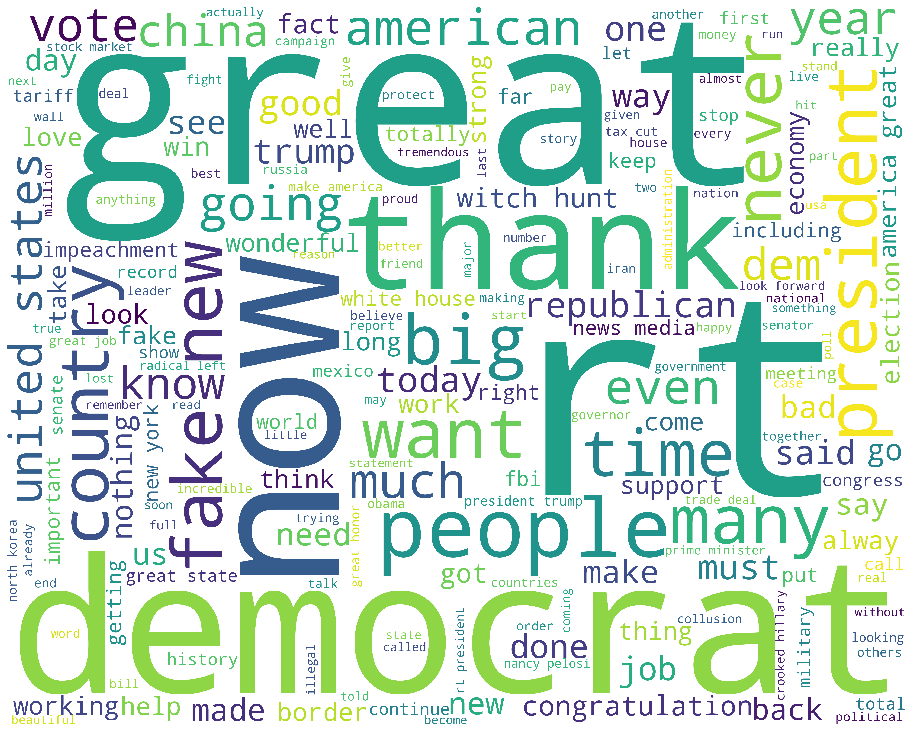

In [33]:
# wordcloud for after he became president

trumpprez_wordcloud = wc.WordCloud(width = 5120, height = 4096, background_color='white', stopwords=wc.STOPWORDS
                                  ).generate(trump_prezwords)

plt.figure(figsize=(20,10), facecolor = 'white', edgecolor='blue')
plt.imshow(trumpprez_wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show();

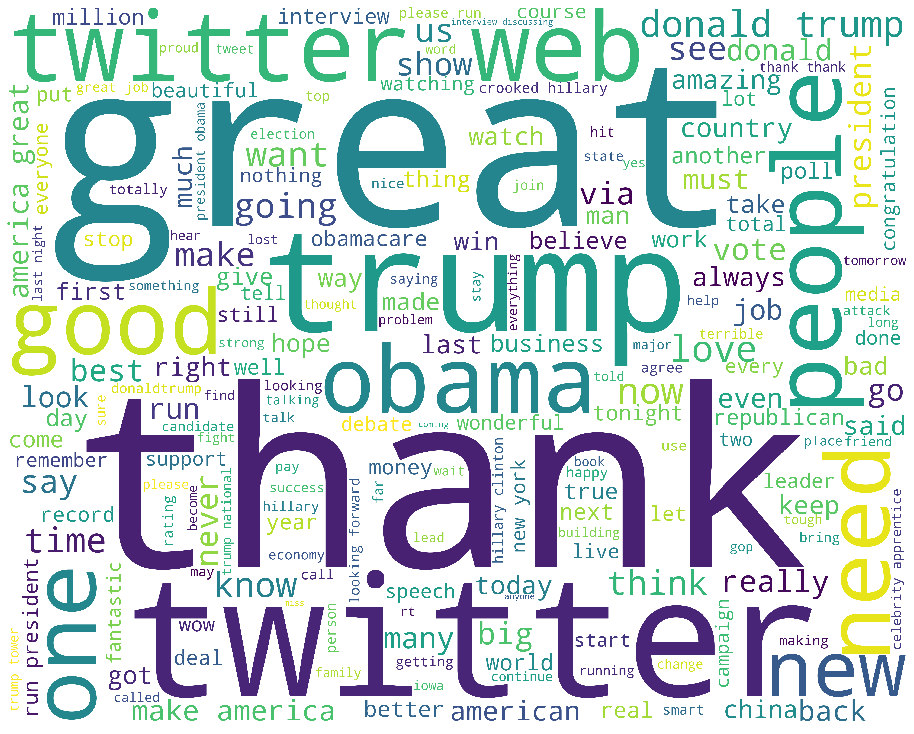

In [34]:
# wordcloud for before he was president
# he uses his own name quite a bit while tweeting, and Obama remains in use after his election

trumpnotprez_wordcloud = wc.WordCloud(width = 5120, height = 4096, background_color='white', stopwords=wc.STOPWORDS
                                  ).generate(trump_notprezwords)

plt.figure(figsize=(20,10), facecolor = 'white', edgecolor='blue')
plt.imshow(trumpnotprez_wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show();

#### Analyzing some easy numbers

In [35]:
# dividing to president vs before being president

prez_trump_tweets = trump_ts['2020-04-06':'2017-01-20']
notprez_trump_tweets = trump_ts['2017-01-19':'2009-05-04']

In [36]:
print (f"Tweets as president {prez_trump_tweets.text.count()}\n"
       f"Tweets before being president {notprez_trump_tweets.text.count()}")

Tweets as president 12786
Tweets before being president 26527


In [37]:
print (f"Number of tweets by year and tweets per day in each year:\n"
       f"2009: {trump_ts['2009'].text.count()}, NA\n"
       f"2010: {trump_ts['2010'].text.count()}, {trump_ts['2010'].text.count()/365:.1f}\n"
       f"2011: {trump_ts['2011'].text.count()}, {trump_ts['2011'].text.count()/365:.1f}\n"
       f"2012: {trump_ts['2012'].text.count()}, {trump_ts['2012'].text.count()/366:.1f}\n"
       f"2013: {trump_ts['2013'].text.count()}, {trump_ts['2013'].text.count()/365:.1f}\n"
       f"2014: {trump_ts['2014'].text.count()}, {trump_ts['2014'].text.count()/365:.1f}\n"
       f"2015: {trump_ts['2015'].text.count()}, {trump_ts['2015'].text.count()/365:.1f}\n"
       f"2016: {trump_ts['2016'].text.count()}, {trump_ts['2016'].text.count()/366:.1f}\n"
       f"2017: {trump_ts['2017'].text.count()}, {trump_ts['2017'].text.count()/365:.1f}\n"
       f"2018: {trump_ts['2018'].text.count()}, {trump_ts['2018'].text.count()/365:.1f}\n"
       f"2019: {trump_ts['2019'].text.count()}, {trump_ts['2019'].text.count()/365:.1f}\n"
       f"2020: {trump_ts['2020'].text.count()}, {trump_ts['2020'].text.count()/96:.1f}\n")

Number of tweets by year and tweets per day in each year:
2009: 56, NA
2010: 142, 0.4
2011: 763, 2.1
2012: 3212, 8.8
2013: 6693, 18.3
2014: 5308, 14.5
2015: 6587, 18.0
2016: 3643, 10.0
2017: 2260, 6.2
2018: 2901, 7.9
2019: 6598, 18.1
2020: 1177, 12.3



In [38]:
# plotting tweets per year for a quick look

tweets_per_day = np.round([(trump_ts['2011'].text.count()/365), (trump_ts['2012'].text.count()/366),
                           (trump_ts['2013'].text.count()/365), (trump_ts['2014'].text.count()/365),
                           (trump_ts['2015'].text.count()/365), (trump_ts['2016'].text.count()/366),
                           (trump_ts['2017'].text.count()/365), (trump_ts['2018'].text.count()/365),
                           (trump_ts['2019'].text.count()/365), (trump_ts['2020'].text.count()/96)], 1)

years = [2011,2012,2013,2014,2015,2016,2017,2018,2019,2020]

px.bar(tweets_per_day, x=years, y=tweets_per_day, title='Tweets Per Day')

In [39]:
# looking at the the difference between his reach (RTs plus favorite) before and after being president

RT_prez = trump_ts['2020-04-06':'2017-01-20'].retweet_count.sum()
fav_prez = trump_ts['2020-03-29':'2017-01-20'].favorite_count.sum()
RT_notprez = trump_ts['2017-01-19':'2009-05-04'].retweet_count.sum()
fav_notprez = trump_ts['2017-01-19':'2009-05-04'].favorite_count.sum()
print(f"Reach as president:\n"
      f"\t{RT_prez/prez_trump_tweets.text.count():.2f} RTs per tweet\n"
      f"\t{fav_prez/prez_trump_tweets.text.count():.2f} favorites per tweet\n"
      f"Reach before being president:\n"
      f"\t{RT_notprez/notprez_trump_tweets.text.count():.2f} RTs per tweet\n"
      f"\t{fav_notprez/notprez_trump_tweets.text.count():.2f} favorites per tweet")

Reach as president:
	19051.09 RTs per tweet
	72869.29 favorites per tweet
Reach before being president:
	1463.11 RTs per tweet
	3888.23 favorites per tweet


In [40]:
# looking at increase in popularity over the years, starting from 2010

RT_years = np.round(
    [(trump_ts['2010-12-31':'2010-01-01'].retweet_count.sum()/trump_ts['2010-12-31':'2010-01-01'].text.count()),
     (trump_ts['2011-12-31':'2011-01-01'].retweet_count.sum()/trump_ts['2011-12-31':'2011-01-01'].text.count()),
     (trump_ts['2012-12-31':'2012-01-01'].retweet_count.sum()/trump_ts['2012-12-31':'2012-01-01'].text.count()),
     (trump_ts['2013-12-31':'2013-01-01'].retweet_count.sum()/trump_ts['2013-12-31':'2013-01-01'].text.count()),
     (trump_ts['2014-12-31':'2014-01-01'].retweet_count.sum()/trump_ts['2014-12-31':'2014-01-01'].text.count()),
     (trump_ts['2015-12-31':'2015-01-01'].retweet_count.sum()/trump_ts['2015-12-31':'2015-01-01'].text.count()),
     (trump_ts['2016-12-31':'2016-01-01'].retweet_count.sum()/trump_ts['2016-12-31':'2016-01-01'].text.count()),
     (trump_ts['2017-12-31':'2017-01-01'].retweet_count.sum()/trump_ts['2017-12-31':'2017-01-01'].text.count()),
     (trump_ts['2018-12-31':'2018-01-01'].retweet_count.sum()/trump_ts['2018-12-31':'2018-01-01'].text.count()),
     (trump_ts['2020-04-06':'2019-01-01'].retweet_count.sum()/trump_ts['2020-03-29':'2019-01-01'].text.count())],
    2)
fav_years = np.round(
    [(trump_ts['2010-12-31':'2010-01-01'].favorite_count.sum()/trump_ts['2010-12-31':'2010-01-01'].text.count()),
     (trump_ts['2011-12-31':'2011-01-01'].favorite_count.sum()/trump_ts['2011-12-31':'2011-01-01'].text.count()),
     (trump_ts['2012-12-31':'2012-01-01'].favorite_count.sum()/trump_ts['2012-12-31':'2012-01-01'].text.count()),
     (trump_ts['2013-12-31':'2013-01-01'].favorite_count.sum()/trump_ts['2013-12-31':'2013-01-01'].text.count()),
     (trump_ts['2014-12-31':'2014-01-01'].favorite_count.sum()/trump_ts['2014-12-31':'2014-01-01'].text.count()),
     (trump_ts['2015-12-31':'2015-01-01'].favorite_count.sum()/trump_ts['2015-12-31':'2015-01-01'].text.count()),
     (trump_ts['2016-12-31':'2016-01-01'].favorite_count.sum()/trump_ts['2016-12-31':'2016-01-01'].text.count()),
     (trump_ts['2017-12-31':'2017-01-01'].favorite_count.sum()/trump_ts['2017-12-31':'2017-01-01'].text.count()),
     (trump_ts['2018-12-31':'2018-01-01'].favorite_count.sum()/trump_ts['2018-12-31':'2018-01-01'].text.count()),
     (trump_ts['2020-04-06':'2019-01-01'].favorite_count.sum()/trump_ts['2020-03-29':'2019-01-01'].text.count())],
    2) 

In [41]:
# plotting the increase in popularity on twitter through RTs, favorite

fig = tools.make_subplots(rows=1, cols=2, subplot_titles=("RTs","Favorites"))

line_RTs = fig.append_trace(go.Line(
    x=years,
    y=RT_years,
    name='RTs',
#    mode='markers',
),row=1,col=1)

line_fav = fig.append_trace(go.Line(
    x=years,
    y=fav_years,
    name='Favorites',
#    mode='markers',
),row=1,col=2)

fig.update_layout(height=500, width=1000, title = "Trump - Increasing Popularity on Twitter")

fig;

C:\Users\samue\Anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead

C:\Users\samue\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [42]:
# when does Trump like to tweet? (times converted from GMT to EST, taking four hours difference)
# this is rough estimate and cannot to be taken at face value as we have not way of knowing when he's not in EST 

print(f"When does Trump like to tweet:\n"
      f"12-6am: {trump_ts.between_time('04:00:01','10:00:00').text.count()}\n"
      f"6-9am: {trump_ts.between_time('10:00:01','13:00:00').text.count()}\n"
      f"9am-12noon: {trump_ts.between_time('13:00:01','16:00:00').text.count()}\n"
      f"12noon-3pm: {trump_ts.between_time('16:00:01','19:00:00').text.count()}\n"
      f"3-6pm: {trump_ts.between_time('19:00:01','22:00:00').text.count()}\n"
      f"6-9pm: {trump_ts.between_time('22:00:01','01:00:00').text.count()}\n"
      f"9pm-12midnight: {trump_ts.between_time('01:00:01','04:00:00').text.count()}\n")


When does Trump like to tweet:
12-6am: 2939
6-9am: 5801
9am-12noon: 6773
12noon-3pm: 5980
3-6pm: 7678
6-9pm: 4769
9pm-12midnight: 5400



<a id='tweets'></a>
### Analyzing Donald Trump's Tweets

In [43]:
# using NLP library NLTK for some basic checks

import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\samue\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [44]:
# tokenize separates his tweets in to sentences (sent_tokenize, which need not be used here) and words (word_tokenize)

from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize

In [45]:
# using functions defined earlier to remove links, remove numbers and special characters
# all words and then converted to lower case

trump_ts.text = trump_ts.text.apply(remove_links)
trump_ts.text = trump_ts.text.apply(filter_alpha)
trump_ts.text = trump_ts.text.str.lower()

In [46]:
# dividing tweets from before he was president and after he was elected

prez_trump = trump_ts['2020-04-06':'2017-01-20']['text']
notprez_trump = trump_ts['2017-01-19':'2009-05-04']['text']

In [47]:
# making two lists for the time periods (these variables will be used later with another NLP library as well)

prez_trumptweets = ' '.join(trump_prez.tolist())
notprez_trumptweets = ' '.join(trump_notprez.tolist())

In [48]:
# breaking down into words

tokenized_prezwords = word_tokenize(prez_trumptweets)
tokenized_notprezwords = word_tokenize(notprez_trumptweets)

In [49]:
# FreqDist provides the words most frequently used

from nltk.probability import FreqDist

In [50]:
# obviously the most frequent are 'stopwords', words like 'the', 'to', 'of' and so on which has to be discounted

prez_fdist = FreqDist(tokenized_prezwords)
prez_fdist.most_common(20)

[('the', 17655),
 ('to', 9256),
 ('and', 8401),
 ('of', 7088),
 ('a', 6059),
 ('is', 5087),
 ('in', 5081),
 ('for', 3997),
 ('on', 3069),
 ('that', 2997),
 ('i', 2854),
 ('are', 2844),
 ('will', 2796),
 ('our', 2778),
 ('with', 2706),
 ('be', 2570),
 ('great', 2527),
 ('we', 2316),
 ('rt', 2134),
 ('they', 2112)]

In [51]:
# nltk has a list of stopwords that can be called so that it can be discounted

stop_words = nltk.corpus.stopwords.words('english')

In [52]:
# removing stopwords

tokenized_prezwords = [word for word in tokenized_prezwords if word not in stop_words]

In [53]:
# we see it's very similar to what was found from the wordcloud

prez_fdist = FreqDist(tokenized_prezwords)
prez_fdist

FreqDist({'great': 2527, 'rt': 2134, 'president': 1188, 'people': 1093, 'thank': 1006, 'democrats': 963, 'fake': 808, 'big': 793, 'news': 778, 'new': 770, ...})

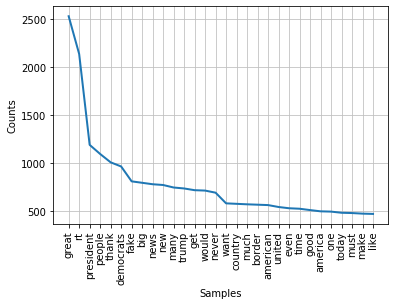

In [54]:
prez_fdist.plot(30,cumulative=False);

### Sentiment analysis

In [55]:
# TextBlob is another NLP library, and one that is more versatile than NLTK according to the blog linked at the start

from textblob import TextBlob

In [56]:
# defining two functions that measure sentiment and subjectivity of Trump's tweets
# both are functions of TextBlob, but putting in a function for multiple use

def sentiment (tweet):
    analysis = TextBlob(tweet)
    Sentiment = analysis.sentiment[0]
    return Sentiment
 

def subjectivity (tweet):
    analysis = TextBlob(tweet)
    Subjectivity = analysis.sentiment[1]
    return Subjectivity 

In [57]:
trump_ts["Sentiment"] = trump_ts.text.map(lambda x:sentiment (x))
trump_ts["Subjectivity"] = trump_ts.text.map(lambda x:subjectivity (x))

In [58]:
trump_ts[["Sentiment","Subjectivity"]].head(5)

,Sentiment,Subjectivity
created_at,,
2020-04-06 11:55:14,0.400000,0.700000
2020-04-06 11:54:33,0.000000,0.000000
2020-04-06 11:53:00,-0.183333,0.627778
2020-04-06 11:49:57,0.108125,0.468750
2020-04-06 11:40:45,-0.500000,0.900000


In [59]:
trump_ts[["Sentiment","Subjectivity"]].tail(5)

,Sentiment,Subjectivity
created_at,,
2009-05-12 14:07:28,0.000000,0.000000
2009-05-08 20:40:15,0.136364,0.454545
2009-05-08 13:38:08,0.080000,0.280000
2009-05-05 01:00:10,0.136364,0.454545
2009-05-04 18:54:25,0.175000,0.497222


In [60]:
# using plotly.express (an "easy-to-use, high-level interface to Plotly") for the graphs
# Analysis shows his tweets are mostly subjective, with an equal distribution of positive and negative sentiment

px.scatter(trump_ts, x = "Sentiment", y = "Subjectivity")

In [61]:
# doing the same analysis for his time as president, and before he was president (next cell)

trump_ts_prez = trump_ts['2020-04-06':'2017-01-20']
trump_ts_prez[["Sentiment","Subjectivity"]].head()

,Sentiment,Subjectivity
created_at,,
2020-04-05 22:19:59,0.000000,0.000000
2020-04-05 19:35:34,0.008466,0.558730
2020-04-05 19:30:11,0.047273,0.330909
2020-04-05 16:30:32,0.000000,0.000000
2020-04-05 16:26:33,0.000000,0.000000


In [62]:
trump_ts_notprez = trump_ts['2017-01-19':'2009-05-04']
trump_ts_notprez[["Sentiment","Subjectivity"]].head()

,Sentiment,Subjectivity
created_at,,
2017-01-18 22:21:02,1.000000,1.000000
2017-01-18 17:33:25,0.000000,0.000000
2017-01-18 14:03:53,0.333333,0.338889
2017-01-18 13:06:58,-0.443750,0.583333
2017-01-18 13:00:51,0.500000,0.900000


In [63]:
# it seems his time as president has not fundementally altered the way he tweets
# but maybe there are significantly more positive tweets

px.scatter(trump_ts_prez, x = "Sentiment", y = "Subjectivity")

In [64]:
# there are many more datapoints for his time before he was president, and the pattern is established here

px.scatter(trump_ts_notprez, x = "Sentiment", y = "Subjectivity")

In [65]:
# plotting now based on years (just over three as president), and one graph with two years from the start of the decade

trump_2020 = trump_ts['2020-04-06':'2020-01-01'][["Sentiment","Subjectivity"]]
trump_2019 = trump_ts['2019-12-31':'2019-01-01'][["Sentiment","Subjectivity"]]
trump_2018 = trump_ts['2018-12-31':'2018-01-01'][["Sentiment","Subjectivity"]]
trump_2017 = trump_ts['2017-12-31':'2017-01-01'][["Sentiment","Subjectivity"]]
trump_2016 = trump_ts['2016-12-31':'2016-01-01'][["Sentiment","Subjectivity"]]
trump_2010_2012 = trump_ts['2012-12-31':'2010-01-01'][["Sentiment","Subjectivity"]]

In [66]:
# plotting now based on years (just over three as president), and one graph with two years from the start of the decade

fig = tools.make_subplots(rows=6, cols=1, subplot_titles=("2020","2019","2018","2017","2016","2010-2012"))

scatter_1 = fig.append_trace(go.Scatter(
    x=trump_2020.Sentiment,
    y=trump_2020.Subjectivity,
    name='2020',
    mode='markers',
),row=1,col=1)

scatter_2 = fig.append_trace(go.Scatter(
    x=trump_2019.Sentiment,
    y=trump_2019.Subjectivity,
    name='2019',
    mode='markers',
),row=2,col=1)

scatter_3 = fig.append_trace(go.Scatter(
    x=trump_2018.Sentiment,
    y=trump_2018.Subjectivity,
    name='2018',
    mode='markers'
),row=3,col=1)

scatter_4 = fig.append_trace(go.Scatter(
    x=trump_2017.Sentiment,
    y=trump_2017.Subjectivity,
    name='2017',
    mode='markers',
),row=4,col=1)

scatter_5 = fig.append_trace(go.Scatter(
    x=trump_2016.Sentiment,
    y=trump_2016.Subjectivity,
    name='2016',
    mode='markers',
),row=5,col=1)

scatter_6 = fig.append_trace(go.Scatter(
    x=trump_2010_2012.Sentiment,
    y=trump_2010_2012.Subjectivity,
    name='2010',
    mode='markers',
),row=6,col=1)


fig.update_layout(height=2000, width=1000, title = "Trump - Sentiment and Subjectivity over the years")

fig

C:\Users\samue\Anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [67]:
# who or what does Trump talk about - 'Noun phrase extraction' can be used to find this
# using variables 'prez_trumptweets' and 'notprez_trumptweets' defined earlier

nouns_prez = TextBlob(prez_trumptweets)
nouns_notprez = TextBlob(notprez_trumptweets)

In [68]:
nouns_prez = nouns_prez.noun_phrases

In [69]:
nouns_notprez = nouns_notprez.noun_phrases

In [71]:
common_nouns_prez = FreqDist(nouns_prez)
common_nouns_prez.most_common(20)

# as expected, he talks a lot about 'fake news', and mentions himself apart from Obama and Hillary quite a bit

[('fake news', 238),
 ('great state', 160),
 ('fake news media', 136),
 ('witch hunt', 132),
 ('great honor', 121),
 ('white house', 116),
 ('great job', 98),
 ('president trump', 98),
 ('republican party', 80),
 ('hillary clinton', 68),
 ('new york times', 65),
 ('southern border', 63),
 ('great people', 62),
 ('american people', 60),
 ('new york', 57),
 ('nancy pelosi', 57),
 ('prime minister', 54),
 ('border security', 54),
 ('stock market', 50),
 ('president obama', 47)]

In [72]:
common_nouns_notprez = FreqDist(nouns_notprez)
common_nouns_notprez.most_common(20)

# before he became the US president, he tweeted about himself (or his business interests) quite a bit

[('donald trump', 351),
 ('twitter web', 302),
 ('great job', 121),
 ('hillary clinton', 114),
 ('celebrity apprentice', 114),
 ('president obama', 90),
 ('new york', 81),
 ('white house', 75),
 ('great i', 74),
 ('country needs', 74),
 ('i hope', 73),
 ('trump tower', 71),
 ('great twitter', 63),
 ('president i', 59),
 ('mr trump', 57),
 ('new hampshire', 55),
 ('golf course', 49),
 ('america needs', 48),
 ('happy birthday', 47),
 ('great time', 45)]

######  

<a id='RTs'></a>
### Some basic analysis of what he Retweets

In [73]:
RT = trump[trump.is_retweet == 'true'] # choosing only the retweets

In [74]:
RT.text = tweets.text.apply(remove_links) # removing links
RT.text = tweets.text.apply(filter_alpha) #removing non-alphabet charecters (numbers, punctuation)
RT.text = tweets.text.str.lower() # making it uniformely lower
RT = tweets[tweets.text != ""] # removing any empty tweets

C:\Users\samue\Anaconda3\lib\site-packages\pandas\core\generic.py:5303: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [75]:
RT[RT.text == ""] # no empty tweets

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str


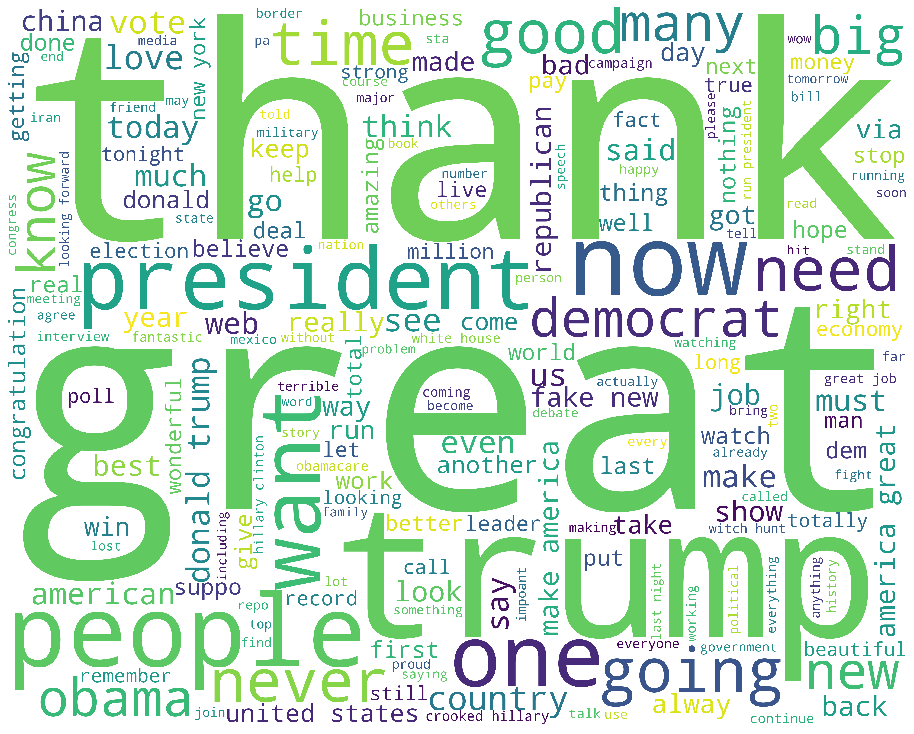

In [76]:
# making a wordcloud

trump_RT_words = ' '.join(RT.text.tolist()).replace('rt','').replace('twitter','').replace('will','')

trump_RT_wordcloud = wc.WordCloud(width = 5120, height = 4096, background_color='white',
                               stopwords=wc.STOPWORDS).generate(trump_RT_words)

plt.figure(figsize=(20,10), facecolor = 'white', edgecolor='blue')
plt.imshow(trump_RT_wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show();

In [77]:
# as earlier, making a separate wordcloud for the time he's been US president

RT_ts = tweets.set_index('created_at')
RT_ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39340 entries, 2020-04-06 11:55:14 to 2009-05-04 18:54:25
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   source          39340 non-null  object 
 1   text            39340 non-null  object 
 2   retweet_count   39340 non-null  float64
 3   favorite_count  39340 non-null  int64  
 4   is_retweet      39340 non-null  object 
 5   id_str          39340 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 2.1+ MB


In [78]:
RT_prez = RT_ts['2020-04-06':'2017-01-20'] # separating his time as president

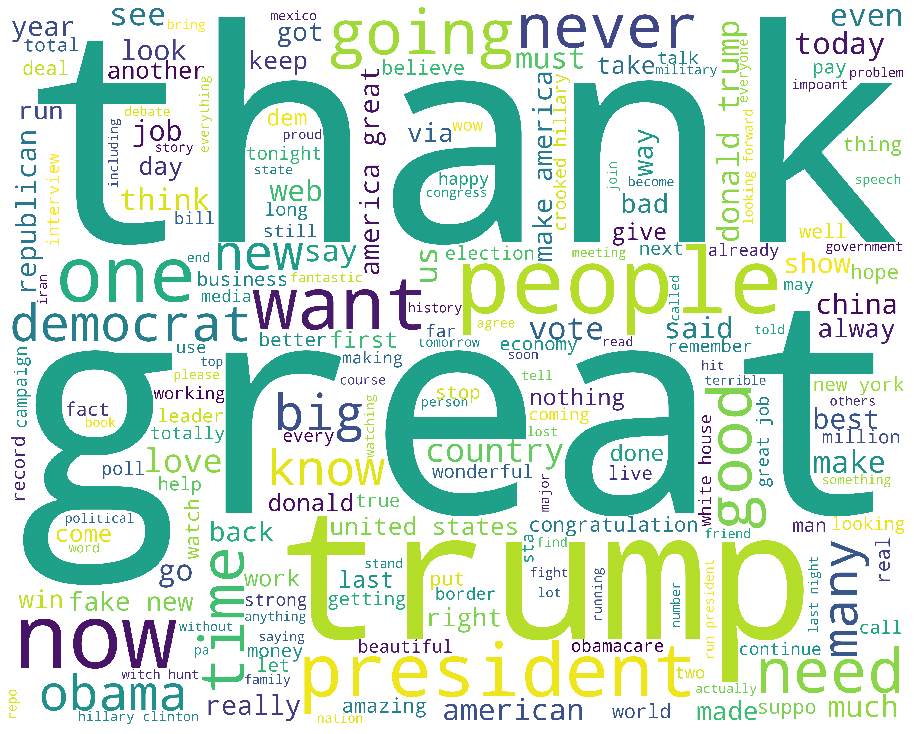

In [79]:
prez_trump_RT_words = ' '.join(RT.text.tolist()).replace('rt','').replace('twitter','').replace('will','')

prez_trump_RT_wordcloud = wc.WordCloud(width = 5120, height = 4096, background_color='white',
                               stopwords=wc.STOPWORDS).generate(prez_trump_RT_words)

plt.figure(figsize=(20,10), facecolor = 'white', edgecolor='blue')
plt.imshow(prez_trump_RT_wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show();

#### Using NLTK frequency distribution

In [80]:
RTs_trump = RT_ts['2020-04-06':'2017-01-20']['text'] # getting only the tweet text for his time as president

In [81]:
prez_RTs = ' '.join(trump_prez.tolist())

In [82]:
tokenized_prez_RTs = word_tokenize(prez_RTs)

In [83]:
# using the frequency distribution function from the NLTK library

stop_words = nltk.corpus.stopwords.words('english')
tokenized_prez_RTs = [word for word in tokenized_prez_RTs if word not in stop_words]

prez_RTs_fdist = FreqDist(tokenized_prez_RTs)

prez_RTs_fdist.most_common(20)

[('great', 2527),
 ('rt', 2134),
 ('president', 1188),
 ('people', 1093),
 ('thank', 1006),
 ('democrats', 963),
 ('fake', 808),
 ('big', 793),
 ('news', 778),
 ('new', 770),
 ('many', 744),
 ('trump', 734),
 ('get', 716),
 ('would', 712),
 ('never', 690),
 ('want', 579),
 ('country', 574),
 ('much', 569),
 ('border', 565),
 ('american', 561)]

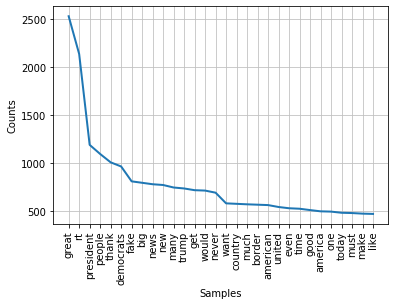

In [84]:
prez_RTs_fdist.plot(30,cumulative=False); # plotting the frequency of words

#### Sentiment analysis for his retweets

In [85]:
RT_ts["Sentiment"] = RT_ts.text.map(lambda x:sentiment (x))
RT_ts["Subjectivity"] = RT_ts.text.map(lambda x:subjectivity (x))

In [86]:
RT_ts[["Sentiment","Subjectivity"]].head(5)

,Sentiment,Subjectivity
created_at,,
2020-04-06 11:55:14,0.400000,0.700000
2020-04-06 11:54:33,0.000000,0.000000
2020-04-06 11:53:00,-0.183333,0.627778
2020-04-06 11:49:57,0.108125,0.468750
2020-04-06 11:40:45,-0.500000,0.900000


In [87]:
RT_prez = RT_ts['2020-04-06':'2017-01-20']

In [88]:
px.scatter(RT_prez, x = "Sentiment", y = "Subjectivity")

#####  

<a id='sources'></a>
#### Sources of information:
#### https://www.analyticsvidhya.com/blog/2018/02/natural-language-processing-for-beginners-using-textblob/
#### https://textblob.readthedocs.io/en/dev/
#### https://www.kaggle.com/motokinakamura/sentiment-analysis-clustering
#### https://www.analyticsvidhya.com/blog/2018/02/the-different-methods-deal-text-data-predictive-python/

##### Tweets updated till April 6, 2020 (12pm GMT)
##### Source of dataset: [Trump Twitter Archive](http://www.trumptwitterarchive.com/)
##### [Click to view viz rendered properly](https://nbviewer.jupyter.org/github/iamsama/TrumpTwitter/blob/master/Project%20-%20Trump%20Tweets.ipynb)